# RETO-TEST PYTHON FOR DATA:

La empresa ficticia "Global Importaciones" ha decidido implementar un sistema de gestión de pedidos utilizando la base de datos Northwind como referencia. La empresa se dedica a la importación y distribución de productos a nivel internacional. Como analista de datos para la empresa internacional "Global Importaciones", te enfrentas al desafío de extraer información clave de la base de datos Northwind para optimizar la gestión de pedidos. La dirección ha solicitado insights específicos para tomar decisiones informadas. 

Para poder resolver este ejercicio primero, es necesario que instales la BBDD de 'Northwind' en Postgres/DBeaver, a continuación deberás generar una conexión entre Python y Postgres/DBeaver para poder realizar los siguientes ejercicios.

In [11]:
import psycopg2
import pandas as pd
pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)
import plotly.express as px

In [12]:
conn = psycopg2.connect(host = "localhost", 
                        database = "northwind",
                        user = "postgres", 
                        password = "admin")

## Ejercicio 1. Familiarizarse con la Base de Datos:
### Descripción del ejercicio:
El primer paso como analista de datos es conocer la estructura y la información básica de nuestra BBDD, Crea el esquema de northwind y observa con atención las tablas que tiene y cómo están relacionadas entre sí.

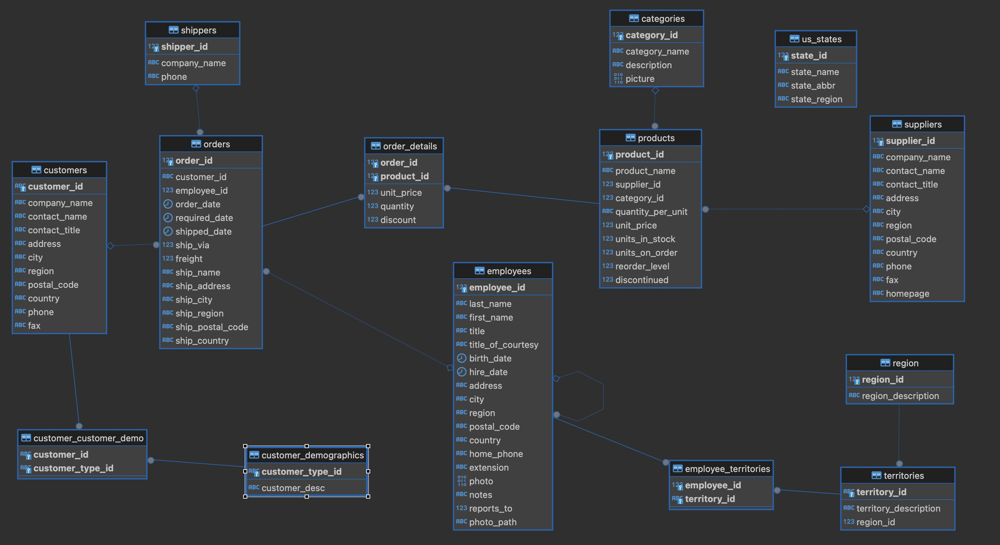

## Ejercicio 2. Primeras consultas
### Descripción del ejercicio:
Ahora vamos a sacar información básica de nuestra BBDD, para ello tienes que generar las Queries necesarias para responder a las siguientes preguntas:
- ¿Cuántos empleados tenemos contratados en 'Global Importaciones'? Indica su id, nombre, apellido, ciudad y país.

- ¿Qué productos tenemos? Indica el id del producto, id del proveedor, nombre del producto, precio por unidad, unidades en stock, unidades pedidas al proveedor y productos descontinuados.
- ¿Tenemos productos descontinuados?. Indica el nombre del producto, y cantidad que nos queda en stock. (El atributo Discontinued es un booleano: si es igual a 1 el producto ha sido descontinuado.)
- ¿Qué proveedores tenemos? Indica el id de la compañía, nombre de la compañía, ciudad y país.
- ¿Qué pedidos hemos tenido? Indica el número de pedido, id del cliente,id del transportista,  dia del pedido, día requerido de llegada y día de llegada real.
- ¿Cuántos pedidos hemos tenido?
- ¿Cuántos clientes tenemos? Indica el id del cliente, nombre de la compañía, ciudad y país.
- ¿Con qué empresas de transporte trabajamos? Indica su id del transportista y el nombre de la compañía.
- ¿Cómo son las relaciones de reporte de resultados entre los empleados?
___
- ¿Cuántos empleados tenemos contratados en 'Global Importaciones'? Indica su id, nombre, apellido, ciudad y país.



In [13]:
sql_query = '''SELECT employee_id ,
                CONCAT(first_name,' ',last_name) AS "Empleado", -- Uso el Concat para que me aparezca el nombre y apellido en una única columna
                city AS "Ciudad_Empleado", 
                country AS "País_Empleado"
FROM employees'''
cursor = conn.cursor() #Creamos una variable con la que iniciamos el cursor
cursor.execute(sql_query) #Ejecutamos la query
rows = cursor.fetchall() #Creamos una variable con el restultado de la query en forma de lista de tuplas
empleados = pd.DataFrame(rows)#Genereamos un DataFrame a partir de la variable anterior
colnames = [desc[0] for desc in cursor.description] #Recuperamos los nombres de las columnas de la BBDD
empleados = empleados.set_axis(colnames, axis = 1)#Renombramos las columnas del DF creado para que coincidan con las de la BBDD
empleados

,employee_id,Empleado,Ciudad_Empleado,País_Empleado
0,1,Nancy Davolio,Seattle,USA
1,2,Andrew Fuller,Tacoma,USA
2,3,Janet Leverling,Kirkland,USA
3,4,Margaret Peacock,Redmond,USA
4,5,Steven Buchanan,London,UK
5,6,Michael Suyama,London,UK
6,7,Robert King,London,UK
7,8,Laura Callahan,Seattle,USA
8,9,Anne Dodsworth,London,UK



___
- ¿Qué productos tenemos? Indica el id del producto, id del proveedor, nombre del producto, precio por unidad, unidades en stock, unidades pedidas al proveedor y productos descontinuados


In [14]:
sql_query = '''SELECT product_id ,
                    supplier_id, 
                    product_name AS "Nombre_Producto", 
                    unit_price AS "Precio_Unidad", 
                    units_in_stock AS "Unidades_Stock", 
                    units_on_order AS "Unidades_Pedidas", 
                    discontinued AS "Producto_Descontinuado"
FROM products'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
productos = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
productos = productos.set_axis(colnames, axis = 1)
productos


,product_id,supplier_id,Nombre_Producto,Precio_Unidad,Unidades_Stock,Unidades_Pedidas,Producto_Descontinuado
0,1,8,Chai,18.00,39,0,1
1,2,1,Chang,19.00,17,40,1
2,3,1,Aniseed Syrup,10.00,13,70,0
3,4,2,Chef Anton's Cajun Seasoning,22.00,53,0,0
4,5,2,Chef Anton's Gumbo Mix,21.35,0,0,1
...,...,...,...,...,...,...,...
72,73,17,Röd Kaviar,15.00,101,0,0
73,74,4,Longlife Tofu,10.00,4,20,0
74,75,12,Rhönbräu Klosterbier,7.75,125,0,0
75,76,23,Lakkalikööri,18.00,57,0,0


___
- ¿Tenemos productos descontinuados?. Indica el nombre del producto, y cantidad que nos queda en stock. (El atributo Discontinued es un booleano: si es igual a 1 el producto ha sido descontinuado.)


In [15]:
sql_query = '''SELECT product_id ,
                      product_name AS "Nombre_Producto", 
                      units_in_stock AS "Unidades_Stock"
FROM products
WHERE discontinued = 1 --Usamos la condición para sólo seleccionar los productos descontinuados''' 
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
productos_disc = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
productos_disc = productos_disc.set_axis(colnames, axis = 1)
productos_disc

,product_id,Nombre_Producto,Unidades_Stock
0,1,Chai,39
1,2,Chang,17
2,5,Chef Anton's Gumbo Mix,0
3,9,Mishi Kobe Niku,29
4,17,Alice Mutton,0
5,24,Guaraná Fantástica,20
6,28,Rössle Sauerkraut,26
7,29,Thüringer Rostbratwurst,0
8,42,Singaporean Hokkien Fried Mee,26
9,53,Perth Pasties,0


___
- ¿Qué proveedores tenemos? Indica el id de la compañía, nombre de la compañía, ciudad y país.


In [16]:
sql_query = '''SELECT supplier_id ,
                company_name AS "Nombre_Proveedor", 
                city AS "Ciudad_Proveedor", 
                country AS "País_Proveedor"
FROM suppliers
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
proveedores = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
proveedores = proveedores.set_axis(colnames, axis = 1)
proveedores

,supplier_id,Nombre_Proveedor,Ciudad_Proveedor,País_Proveedor
0,1,Exotic Liquids,London,UK
1,2,New Orleans Cajun Delights,New Orleans,USA
2,3,Grandma Kelly's Homestead,Ann Arbor,USA
3,4,Tokyo Traders,Tokyo,Japan
4,5,Cooperativa de Quesos 'Las Cabras',Oviedo,Spain
5,6,Mayumi's,Osaka,Japan
6,7,"Pavlova, Ltd.",Melbourne,Australia
7,8,"Specialty Biscuits, Ltd.",Manchester,UK
8,9,PB Knäckebröd AB,Göteborg,Sweden
9,10,Refrescos Americanas LTDA,Sao Paulo,Brazil


___
- ¿Qué pedidos hemos tenido? Indica el número de pedido, id del cliente,id del transportista,  dia del pedido, día requerido de llegada y día de llegada real.


In [56]:
sql_query = '''SELECT order_id, 
                      customer_id, 
                      ship_via, 
                      order_date AS "Día_pedido", 
                      required_date AS "Llegada_requerida", 
                      shipped_date AS "Llegada_real"
FROM orders
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
pedidos = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
pedidos = pedidos.set_axis(colnames, axis = 1)
pedidos

,order_id,customer_id,ship_via,Día_pedido,Llegada_requerida,Llegada_real
0,10248,VINET,3,1996-07-04,1996-08-01,1996-07-16
1,10249,TOMSP,1,1996-07-05,1996-08-16,1996-07-10
2,10250,HANAR,2,1996-07-08,1996-08-05,1996-07-12
3,10251,VICTE,1,1996-07-08,1996-08-05,1996-07-15
4,10252,SUPRD,2,1996-07-09,1996-08-06,1996-07-11
...,...,...,...,...,...,...
825,11073,PERIC,2,1998-05-05,1998-06-02,None
826,11074,SIMOB,2,1998-05-06,1998-06-03,None
827,11075,RICSU,2,1998-05-06,1998-06-03,None
828,11076,BONAP,2,1998-05-06,1998-06-03,None


___
- ¿Cuántos pedidos hemos tenido?


In [57]:
sql_query = '''SELECT COUNT(DISTINCT order_id) AS "Pedidos_Totales" -- Contamos todos los pedidos distintos para saber el número de pedidos totales 
FROM orders 
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
pedidos_tot = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
pedidos_tot.set_axis(colnames, axis = 1)

,Pedidos_Totales
0,830


___
- ¿Cuántos clientes tenemos? Indica el id del cliente, nombre de la compañía, ciudad y país.


In [58]:
sql_query = '''SELECT customer_id, 
                company_name AS "Compañía",
                city AS "Ciudad_Cliente",
                 country AS "País_Cliente"
FROM customers 
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
clientes = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
clientes = clientes.set_axis(colnames, axis = 1)
clientes

,customer_id,Compañía,Ciudad_Cliente,País_Cliente
0,ALFKI,Alfreds Futterkiste,Berlin,Germany
1,ANATR,Ana Trujillo Emparedados y helados,México D.F.,Mexico
2,ANTON,Antonio Moreno Taquería,México D.F.,Mexico
3,AROUT,Around the Horn,London,UK
4,BERGS,Berglunds snabbköp,Luleå,Sweden
...,...,...,...,...
86,WARTH,Wartian Herkku,Oulu,Finland
87,WELLI,Wellington Importadora,Resende,Brazil
88,WHITC,White Clover Markets,Seattle,USA
89,WILMK,Wilman Kala,Helsinki,Finland


___
- ¿Con qué empresas de transporte trabajamos? Indica su id del transportista y el nombre de la compañía.




In [59]:
#¿Con qué empresas de transporte trabajamos? Indica su shipper_id y el nombre de la compañía.
sql_query = '''SELECT shipper_id, 
                company_name AS "Compañía_Transporte"
FROM shippers
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
transportistas = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
transportistas = transportistas.set_axis(colnames, axis = 1)
transportistas

,shipper_id,Compañía_Transporte
0,1,Speedy Express
1,2,United Package
2,3,Federal Shipping
3,4,Alliance Shippers
4,5,UPS
5,6,DHL


___
- ¿Cómo son las relaciones de reporte de resultados entre los empleados?




In [60]:
#¿Cómo son las relaciones de reporte de resultados entre los empleados?
sql_query = '''SELECT employee_id,
               CONCAT(first_name,' ',last_name) AS Empleado, 
               reports_to AS "Reporta_a"
FROM employees
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
empleados_report = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
empleados_report = empleados_report.set_axis(colnames, axis = 1)
empleados_report
#El jefe de la empresa es Andrew Fuller, ya que es el que no debe reportar a otro empleado

,employee_id,empleado,Reporta_a
0,1,Nancy Davolio,2.0
1,2,Andrew Fuller,NaN
2,3,Janet Leverling,2.0
3,4,Margaret Peacock,2.0
4,5,Steven Buchanan,2.0
5,6,Michael Suyama,5.0
6,7,Robert King,5.0
7,8,Laura Callahan,2.0
8,9,Anne Dodsworth,5.0


___
## Ejercicio 3. Análisis de la empresa
Vamos a crear un par de DataFrames uno con la información de las tablas de pedidos y clientes y otro con la información de productos, proveedores y detalles de los pedidos para poder hacer un estudio de la evolución de nuestra empresa y qué cosas podemos mejorar de esta.
- Haz un estudio de la evolución de los pedidos realizados a lo largo del tiempo. Para ello primero realiza la query necesaria para obtener los meses, años y pedidos durante cada mes. A continuación crea una línea temporal para ver dicha evolución 

- Investiga cuáles son los países donde tenemos más ventas (País origen de la compañía). No es necesario realizar una query para obtener el DataFrame. A raíz de estos datos genera una columna con el continente a partir del siguiente diccionario: 
  ```python
  (continentes = {'Europe': ['Austria', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Ireland', 'Italy', 'Norway', 'Poland', 'Portugal', 'Spain', 'Sweden', 'Switzerland', 'UK'],
   'America': ['Argentina', 'Brazil', 'Canada', 'Mexico', 'USA', 'Venezuela'] })
y estudia la distribución de pedidos por continente. Realiza la visualización que creas más conveniente.   
- Sabemos que algunos pedidos han llegado con retraso, además hay pedidos que no ha sido registrada su llegada. Investiga si la compañía de transporte está relacionada con ello o no. Realiza un boxplot para ver la diferencia de rango intercuartílico.
-  Hay bastante diferencia entre el precio pagado en cada pedido. Averigüa la distribución media del precio del pedido por país de procedencia del cliente. Realiza la visualización que creas más conveniente para sacar conclusiones
- Investiga si existen clientes que no hayan pedido nunca. ¿Qué porcentaje de clientes no tienen pedidos registrados?
- Estudia los productos más demandados e investiga cuáles corre prisa hacer reestock (Los que quedan 20 o menos y no hay unidades pedidas). Realiza la visualización que creas más conveniente para sacar conclusiones.
___
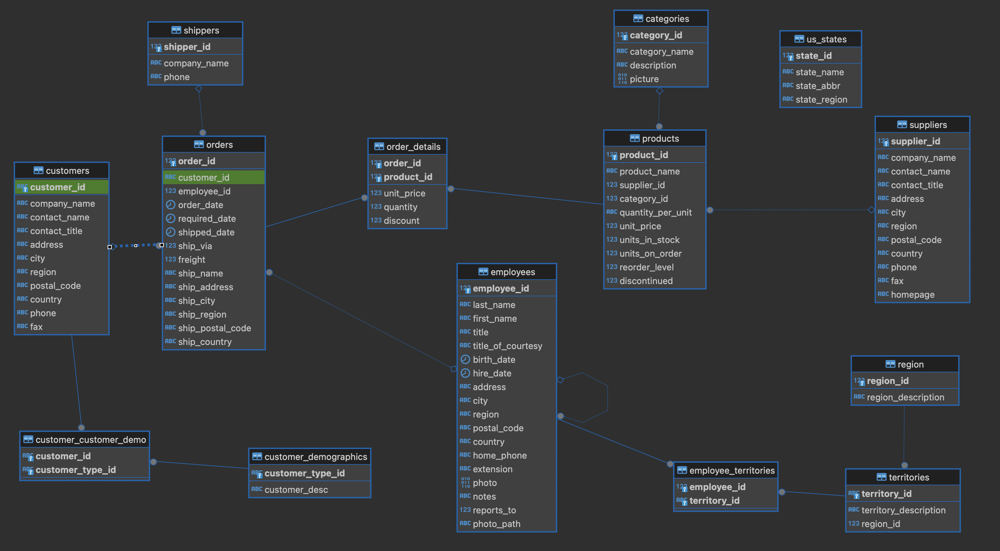


In [61]:
#Creación del DataFrame de pedidos + clientes
#Opción 1. Mediante una query
sql_query = '''SELECT o.order_id,
                    o.ship_via,
                    o.order_date AS "Día_Pedido", 
                    o.required_date AS "Llegada_Requerida", 
                    o.shipped_date AS "Llegada_Real", 
                    c.customer_id, 
                    c.company_name AS "Compañía_Clientes", 
                    c.city AS "Ciudad_Cliente", 
                    c.country AS "País_Cliente"
FROM customers AS c
FULL JOIN orders AS o
ON c.customer_id = o.customer_id  --Realizo un FULL JOIN ya que me interesan tanto los registros que coinciden como los que no.
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
clien_ped = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
clien_ped = clien_ped.set_axis(colnames, axis = 1)
clien_ped

,order_id,ship_via,Día_Pedido,Llegada_Requerida,Llegada_Real,customer_id,Compañía_Clientes,Ciudad_Cliente,País_Cliente
0,10248.0,3.0,1996-07-04,1996-08-01,1996-07-16,VINET,Vins et alcools Chevalier,Reims,France
1,10249.0,1.0,1996-07-05,1996-08-16,1996-07-10,TOMSP,Toms Spezialitäten,Münster,Germany
2,10250.0,2.0,1996-07-08,1996-08-05,1996-07-12,HANAR,Hanari Carnes,Rio de Janeiro,Brazil
3,10251.0,1.0,1996-07-08,1996-08-05,1996-07-15,VICTE,Victuailles en stock,Lyon,France
4,10252.0,2.0,1996-07-09,1996-08-06,1996-07-11,SUPRD,Suprêmes délices,Charleroi,Belgium
...,...,...,...,...,...,...,...,...,...
827,11075.0,2.0,1998-05-06,1998-06-03,None,RICSU,Richter Supermarkt,Genève,Switzerland
828,11076.0,2.0,1998-05-06,1998-06-03,None,BONAP,Bon app',Marseille,France
829,11077.0,2.0,1998-05-06,1998-06-03,None,RATTC,Rattlesnake Canyon Grocery,Albuquerque,USA
830,NaN,NaN,None,None,None,PARIS,Paris spécialités,Paris,France


In [62]:
#Opción 2. Recordemos que previamente hemos creado dos DF uno con los pedidos y otro con los clientes. Si los unimos podemos conseguir el DF objetivo
clien_ped = pedidos.merge(clientes, how = 'outer', left_on = 'customer_id',right_on = 'customer_id')
#Realizo un OUTER JOIN ya que me interesan tanto los registros que coinciden como los que no.
clien_ped

,order_id,customer_id,ship_via,Día_pedido,Llegada_requerida,Llegada_real,Compañía,Ciudad_Cliente,País_Cliente
0,10643.0,ALFKI,1.0,1997-08-25,1997-09-22,1997-09-02,Alfreds Futterkiste,Berlin,Germany
1,10692.0,ALFKI,2.0,1997-10-03,1997-10-31,1997-10-13,Alfreds Futterkiste,Berlin,Germany
2,10702.0,ALFKI,1.0,1997-10-13,1997-11-24,1997-10-21,Alfreds Futterkiste,Berlin,Germany
3,10835.0,ALFKI,3.0,1998-01-15,1998-02-12,1998-01-21,Alfreds Futterkiste,Berlin,Germany
4,10952.0,ALFKI,1.0,1998-03-16,1998-04-27,1998-03-24,Alfreds Futterkiste,Berlin,Germany
...,...,...,...,...,...,...,...,...,...
827,10792.0,WOLZA,3.0,1997-12-23,1998-01-20,1997-12-31,Wolski Zajazd,Warszawa,Poland
828,10870.0,WOLZA,3.0,1998-02-04,1998-03-04,1998-02-13,Wolski Zajazd,Warszawa,Poland
829,10906.0,WOLZA,3.0,1998-02-25,1998-03-11,1998-03-03,Wolski Zajazd,Warszawa,Poland
830,10998.0,WOLZA,2.0,1998-04-03,1998-04-17,1998-04-17,Wolski Zajazd,Warszawa,Poland


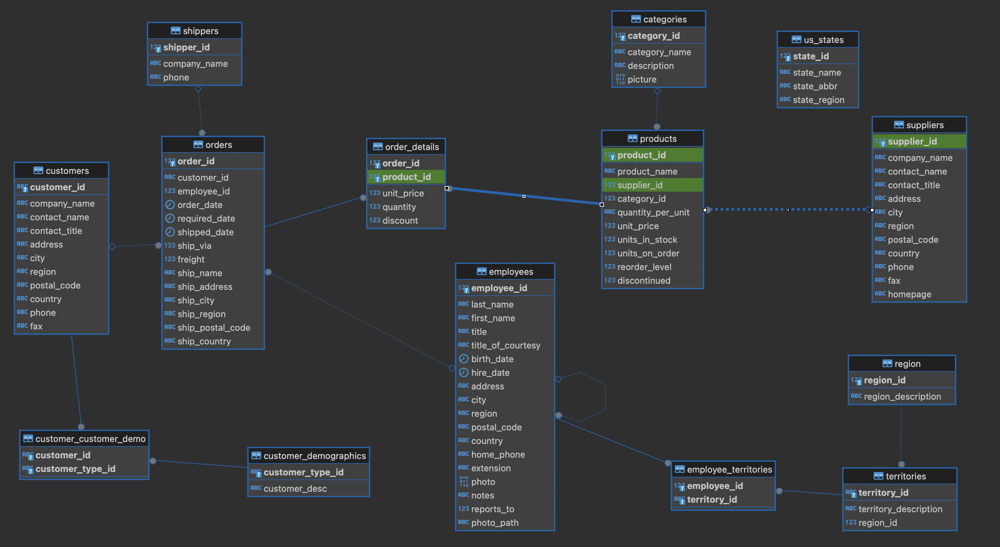

In [63]:
#Creación del DataFrame con la info de productos, proveedores y detalles de los pedidos
#Opción 1.
sql_query = '''SELECT p.product_id,
                      p.product_name AS "Nombre_Producto",
                      p.unit_price AS "Precio_Unidad", 
                      p.units_in_stock AS "Unidades_Stock", 
                      p.units_on_order AS "Unidades_Pedidas", 
                      p.discontinued AS "Producto_Descontinuado", 
                      s.supplier_id ,
                      s.company_name AS "Nombre_Proveedor", 
                      s.city AS "Ciudad_Proveedor", 
                      s.country AS "País_Proveedor",
                      od.order_id, 
                      od.unit_price AS "Precio_Unidad", 
                      od.quantity AS "Cantidad", 
                      od.discount AS "Descuento"
FROM products AS p
FULL JOIN suppliers AS s
ON p.supplier_id = s.supplier_id
FULL JOIN order_details AS od
ON od.product_id = p.product_id -- Realizo dos FULL JOIN ya que me interesan tanto los registros que coinciden como los que no.
'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
prod_provee_det = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
prod_provee_det = prod_provee_det.set_axis(colnames, axis = 1)
prod_provee_det


,product_id,Nombre_Producto,Precio_Unidad,Unidades_Stock,Unidades_Pedidas,Producto_Descontinuado,supplier_id,Nombre_Proveedor,Ciudad_Proveedor,País_Proveedor,order_id,Precio_Unidad,Cantidad,Descuento
0,11,Queso Cabrales,21.00,22,30,0,5,Cooperativa de Quesos 'Las Cabras',Oviedo,Spain,10248,14.00,12,0.00
1,42,Singaporean Hokkien Fried Mee,14.00,26,0,1,20,Leka Trading,Singapore,Singapore,10248,9.80,10,0.00
2,72,Mozzarella di Giovanni,34.80,14,0,0,14,Formaggi Fortini s.r.l.,Ravenna,Italy,10248,34.80,5,0.00
3,14,Tofu,23.25,35,0,0,6,Mayumi's,Osaka,Japan,10249,18.60,9,0.00
4,51,Manjimup Dried Apples,53.00,20,0,0,24,"G'day, Mate",Sydney,Australia,10249,42.40,40,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2150,64,Wimmers gute Semmelknödel,33.25,22,80,0,12,Plutzer Lebensmittelgroßmärkte AG,Frankfurt,Germany,11077,33.25,2,0.03
2151,66,Louisiana Hot Spiced Okra,17.00,4,100,0,2,New Orleans Cajun Delights,New Orleans,USA,11077,17.00,1,0.00
2152,73,Röd Kaviar,15.00,101,0,0,17,Svensk Sjöföda AB,Stockholm,Sweden,11077,15.00,2,0.01
2153,75,Rhönbräu Klosterbier,7.75,125,0,0,12,Plutzer Lebensmittelgroßmärkte AG,Frankfurt,Germany,11077,7.75,4,0.00


___
- Haz un estudio de la evolución de los pedidos realizados a lo largo del tiempo. Para ello primero realiza la query necesaria para obtener los meses, años y pedidos durante cada mes. A continuación crea una línea temporal para ver dicha evolución



In [64]:
sql_query = '''SELECT EXTRACT(MONTH FROM "order_date") AS "Mes", -- Extraigo los meses y años de la columna order_date y genero dos columnas separadas
                      EXTRACT(YEAR FROM "order_date") AS "Año", 
                      COUNT(DISTINCT "order_id") AS "Pedidos_Mes" -- Cuento el número de pedidos por mes 
FROM orders
GROUP BY "Mes", "Año" -- Agrupo por meses y años para poder hacer el conteo de pedidos por año y mes
ORDER BY "Mes", "Año"'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
pedidos_tiempo = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
pedidos_tiempo = pedidos_tiempo.set_axis(colnames, axis = 1)
pedidos_tiempo

,Mes,Año,Pedidos_Mes
0,1,1997,33
1,1,1998,55
2,2,1997,29
3,2,1998,54
4,3,1997,30
5,3,1998,73
6,4,1997,31
7,4,1998,74
8,5,1997,32
9,5,1998,14


In [65]:
#Creamos una columna fecha donde pasemos las columnas Año y Mes a datetime. Es necesario utilizar un valor para día, usaremos 1 de forma arbitraria.
pedidos_tiempo['Fecha'] = pd.to_datetime({'year':pedidos_tiempo['Año'], 'month':pedidos_tiempo['Mes'],'day':1}) 
#Ordenamos los valores por fecha
pedidos_tiempo.sort_values(by = 'Fecha',inplace = True)

In [66]:
#Creamos una linea temporal para ver la evolución de los pedidos a lo largo del tiempo.
fig = px.line(pedidos_tiempo, 
							x = 'Fecha', 
							y = 'Pedidos_Mes', 
							text = 'Pedidos_Mes',#Con esto hacemos que se muestren los valores de los pedidos al mes
							)
fig.update_traces(textposition = "top center")
fig.update_layout(title = dict(text = "Pedidos realizados a lo largo del tiempo", 
															 font = dict(size = 30),
															 automargin = True, 
															 yref = 'paper',
															 x = 0.2,
															 y = 1),
							    legend = dict(yanchor = "top",
														    y = 0.99,
														    xanchor = "right",
														    x = 0.75))
fig.show()

In [67]:
#Sin tener información específica del cliente cualquiera de las opciones de por qué los pedidos han bajado tanto en mayo de 1998 podría ser viable.


___
- Investiga cuáles son los países donde tenemos más ventas (País origen de la compañía). No es necesario realizar una query para obtener el DataFrame. A raíz de estos datos genera una columna con el continente a partir del siguiente diccionario: 
  ```python
  (continentes = {'Europe': ['Austria', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Ireland', 'Italy', 'Norway', 'Poland', 'Portugal', 'Spain', 'Sweden', 'Switzerland', 'UK'],
   'America': ['Argentina', 'Brazil', 'Canada', 'Mexico', 'USA', 'Venezuela'] })
y estudia la distribución de pedidos por continente. Realiza la visualización que creas más conveniente. 


In [68]:
#Primero crearemos un DF agrupando los pedidos por países y haciendo un conteo de los mismos
paises_ped = clien_ped.groupby('País_Cliente')['order_id'].count().reset_index()
#Ordenamos los valores por número de pedidos
paises_ped.sort_values(by = 'order_id',ascending = False)

,País_Cliente,order_id
19,USA,122
8,Germany,122
3,Brazil,83
7,France,77
18,UK,56
20,Venezuela,46
1,Austria,40
16,Sweden,37
4,Canada,30
11,Mexico,28


In [69]:
continentes = {'Europe': ['Austria', 'Belgium', 'Denmark', 'Finland', 'France', 'Germany', 'Ireland', 'Italy', 'Norway', 'Poland', 'Portugal', 'Spain', 'Sweden', 'Switzerland', 'UK'],
   'America': ['Argentina', 'Brazil', 'Canada', 'Mexico', 'USA', 'Venezuela'] }

In [70]:
def col_continetes(pais_df):
    """
    Función para encontrar el continente al que pertenece un país concreto.

    Parámetros:
    - pais_df: nombre del dato país del DataFrame que estamos trabajando

    Retorna:
    - El continente al que pertenece el país si está incluido en el diccionario
    """
    #Iteramos en el diccionario continentes y sacamos su key como continente y sus values como pais
    for continente,pais in continentes.items():
        #Si el país_df se encuentra en la lista de paises nos retorna la clave del diccionario, es decir, el continente
        if pais_df in pais:
            return continente

In [71]:
#Creamos una nueva columna llamada continente, cuyos datos sean el resultado de mapear utilizando la función antes descrita
paises_ped['continente'] = paises_ped['País_Cliente'].map(col_continetes)
#Ahora agrupamos por continente sumando el total de pedidos de cada país
continentes_ped = paises_ped.groupby('continente')['order_id'].sum().reset_index()

In [72]:
fig = px.pie(continentes_ped, values = 'order_id', names = 'continente', color = ['Europe','America'],
             color_discrete_map = {'Europe':'#489C9E','America':'#495084'})
fig.update_layout(title = dict(text = "Distribución de los pedidos por continente.",
															 font = dict(size = 30),
															 automargin = True,
															 yref = 'paper',
															 x = 0.2,
															 y = 1),
							    legend = dict(yanchor = "top",
														    y = 0.99,
														    xanchor = "right",
														    x = 0.75))


fig.show()

___
- Sabemos que algunos pedidos han llegado con retraso, además hay pedidos que no ha sido registrada su llegada. Investiga si la compañía de transporte está relacionada con ello o no. Realiza un boxplot para ver la diferencia de rango intercuartílico.

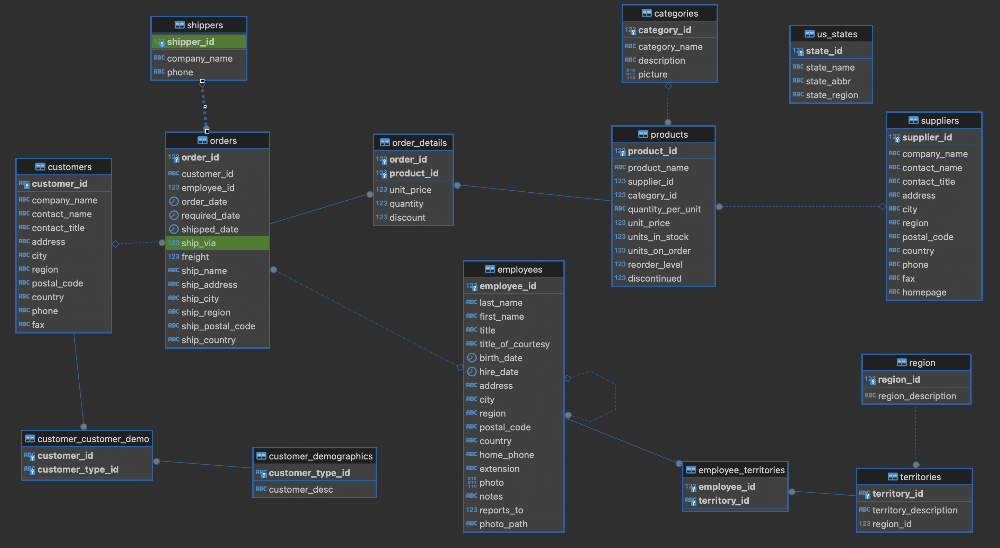

In [73]:
sql_query = '''SELECT (o."shipped_date")-(o."required_date") AS "Días_Retraso", -- Para saber si los pedidos han llegado con retraso restaremos el día de llegada menos el día requerido. Si el resultado es positivo el pedido llegó con retraso.
               s."company_name" AS "Compañía_Transporte"
FROM orders AS o
INNER JOIN shippers AS s -- Realizamos un INNER JOIN porque nos interesan las compañías de transporte que hayan tenido pedidos y viceversa
ON s."shipper_id" = o."ship_via"'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
ped_retr = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
ped_retr = ped_retr.set_axis(colnames, axis = 1)
ped_retr

,Días_Retraso,Compañía_Transporte
0,-16.0,Federal Shipping
1,-37.0,Speedy Express
2,-24.0,United Package
3,-21.0,Speedy Express
4,-26.0,United Package
...,...,...
825,NaN,United Package
826,NaN,United Package
827,NaN,United Package
828,NaN,United Package


In [74]:
#Realizamos un diagrama de cajas para poder sacar información sobre la distribución de los días de retraso por compañía.
fig = px.box(ped_retr, y = 'Días_Retraso', color = 'Compañía_Transporte')

fig.show()

In [75]:
#Estudiemos ahora los registros de llegada por compañía. Primero creamos una lista con los nombres de las compañías.
lista_transporte = ped_retr['Compañía_Transporte'].unique().tolist()

In [76]:
#Ahora iteraremos por la lista para hacer el estudio de cada compañía
for empresa in lista_transporte:
    ped_retr_comp = ped_retr[ped_retr['Compañía_Transporte'] == empresa]#Primero creamos un Df en el que sólo tengamos los datos de la empresa deseada
    porcentaje_nulos = ped_retr_comp['Días_Retraso'].isnull().sum()/ped_retr_comp.shape[0]*100 #Calculamos el porcetaje de nulos
    print(f'La empresa {empresa} no ha registrado un {round(porcentaje_nulos,2)}% de los viajes')#Mostramos el resultado redondeando a 2 decimales.

La empresa Federal Shipping no ha registrado un 2.35% de los viajes
La empresa Speedy Express no ha registrado un 1.61% de los viajes
La empresa United Package no ha registrado un 3.37% de los viajes


___
-  Hay bastante diferencia entre el precio pagado en cada pedido. Averigüa la distribución media del precio del pedido por país de procedencia del cliente. Realiza la visualización que creas más conveniente para sacar conclusiones


In [77]:
sql_query = '''SELECT order_id, 
               SUM(unit_price*quantity-discount*unit_price*quantity) AS "Total_Pedido"
FROM order_details
GROUP BY order_id'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
sum_pedido = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
sum_pedido = sum_pedido.set_axis(colnames, axis = 1)
sum_pedido

,order_id,Total_Pedido
0,11038,732.599998
1,10782,12.500000
2,10725,287.799995
3,10423,1020.000000
4,10518,4150.050007
...,...,...
825,10707,1641.000000
826,10826,730.000000
827,10371,72.959999
828,10575,2147.399986


In [78]:
#Vamos a unir los DataFrames con la info del precio total del pedido junto con el DF con la info de clientes y pedidos.
total_pedidos = sum_pedido.merge(clien_ped, how = 'inner', left_on = 'order_id', right_on = 'order_id')#La unión es de tipo inner ya que nos interesan los pedidos que tienen clienteas asociados.
#Creemos un nuevo DF con la agrupación de países de origen del cliente y la media del total de pedidos.
total_pais = total_pedidos.groupby('País_Cliente')['Total_Pedido'].mean().reset_index()
#Ordenemos los valores de mayor a menor
total_pais.sort_values(by = 'Total_Pedido',ascending = False,inplace=True)

In [79]:
#Hagasmos una visualización para ver en qué países se gastan más dinero de media por pedido
fig = px.bar(total_pais, x = 'País_Cliente', y = 'Total_Pedido')

fig.show()

___

- Investiga si existen clientes que no hayan pedido nunca. ¿Qué porcentaje de clientes no tienen pedidos registrados?


In [80]:
#Investiga si existen pedidos que no tengan asignados ningún cliente
num_ped = clien_ped.groupby('customer_id')['order_id'].count().sort_values(ascending = True)

In [81]:
#¿Qué porcentaje de clientes no tienen pedidos registrados?
clien_ped.isnull().sum()/clien_ped.shape[0]*100

order_id             0.240385
customer_id          0.000000
ship_via             0.240385
Día_pedido           0.240385
Llegada_requerida    0.240385
Llegada_real         2.764423
Compañía             0.000000
Ciudad_Cliente       0.000000
País_Cliente         0.000000
dtype: float64

___
- Estudia los productos más demandados e investiga cuáles corre prisa hacer reestock (Los que quedan 20 o menos y no hay unidades pedidas). Realiza la visualización que creas más conveniente para sacar conclusiones.


In [82]:
#Estudia los productos más demandados e investiga cuáles corre prisa hacer reestock (Los que quedan 20 o menos y no hay unidades pedidas)
prod_provee_det.columns

Index(['product_id', 'Nombre_Producto', 'Precio_Unidad', 'Unidades_Stock',
       'Unidades_Pedidas', 'Producto_Descontinuado', 'supplier_id',
       'Nombre_Proveedor', 'Ciudad_Proveedor', 'País_Proveedor', 'order_id',
       'Precio_Unidad', 'Cantidad', 'Descuento'],
      dtype='object')

In [83]:
#Primero creamos un DF con el conteo del número de veces que se ha pedido cada producto
prod_demand = prod_provee_det.groupby('Nombre_Producto')['order_id'].count().reset_index()

In [84]:
#Creamos el diagrama de barras ordenando de forma descendente para que primero aparezcan los productos más pedidos.
fig = px.bar(prod_demand, x = 'Nombre_Producto', y = 'order_id')
fig.update_layout(barmode = 'stack', xaxis = {'categoryorder':'total descending'})
fig.show()

In [85]:
#Creamos las condiciones para ver qué de qué productos es necesario hacer restock.
#Primero creamos la condición de que queden 20 o menos unidades en stock
menor_20 = prod_provee_det['Unidades_Stock']<= 20
#Ahora cremaos la condución de que sólo usemos los productos que no tenemos unidades pedidas al proveedor
sin_pedidos = prod_provee_det['Unidades_Pedidas'] == 0
#Además, elegimos sólo productos que no esten descontinuados.
no_disc = prod_provee_det['Producto_Descontinuado'] == 0
#Creamos un Df con las tres condiciones anteriores
prod_restock = prod_provee_det[menor_20 & sin_pedidos & no_disc]['Nombre_Producto'].reset_index()
prod_restock

,index,Nombre_Producto
0,2,Mozzarella di Giovanni
1,4,Manjimup Dried Apples
2,6,Manjimup Dried Apples
3,13,Camembert Pierrot
4,36,Tarte au sucre
...,...,...
337,2101,Nord-Ost Matjeshering
338,2115,Uncle Bob's Organic Dried Pears
339,2134,Uncle Bob's Organic Dried Pears
340,2135,Northwoods Cranberry Sauce


In [86]:
#Vemos los valores únicos para saber qué productos cumplen todas las condiciones
prod_restock['Nombre_Producto'].unique()


#La solución es 'Camembert Pierrot' ya que es el 4 producto más pedido y es uno de los que cumple las condiciones necesarias para hacer restock 

array(['Mozzarella di Giovanni', 'Manjimup Dried Apples',
       'Camembert Pierrot', 'Tarte au sucre', 'Steeleye Stout',
       "Uncle Bob's Organic Dried Pears", 'Nord-Ost Matjeshering',
       'Côte de Blaye', 'Gumbär Gummibärchen',
       'Northwoods Cranberry Sauce'], dtype=object)

___
## Ejercicio 4. Queries Avanzadas
Nuestro jefe acaba de venir y nos ha hecho una serie de peticiones sobre la base de datos que tenemos que poder contestar.

- Quiere saber cuándo fue la última vez que se pidió un producto de cada catgoría.

- Necesita saber si existe algún producto que nunca se haya vendido por su precio original.

- Quiere tener toda la información necesaria para poder identificar un tipo de producto. En concreto, tienen especial interés por los productos con categoría "Confections". Devuelve el ID del producto, el nombre del producto y su ID de categoría.

- Quiere saber si existe algún proveedor del que pueda prescindir ya que todos los productos que tiene se encuentran descontinuados.

- Extraer los clientes que compraron mas de 30 articulos "Chai" en un único pedido

- Indica los clientes cuya suma total de carga en los pedidos sea mayor de 1000

- Desde recursos humanos nos piden seleccionar los nombres de las ciudades con 5 o más empleadas de cara a estudiar la apertura de nuevas oficinas.
___



- Quiere saber cuándo fue la última vez que se pidió un producto de cada categoría.

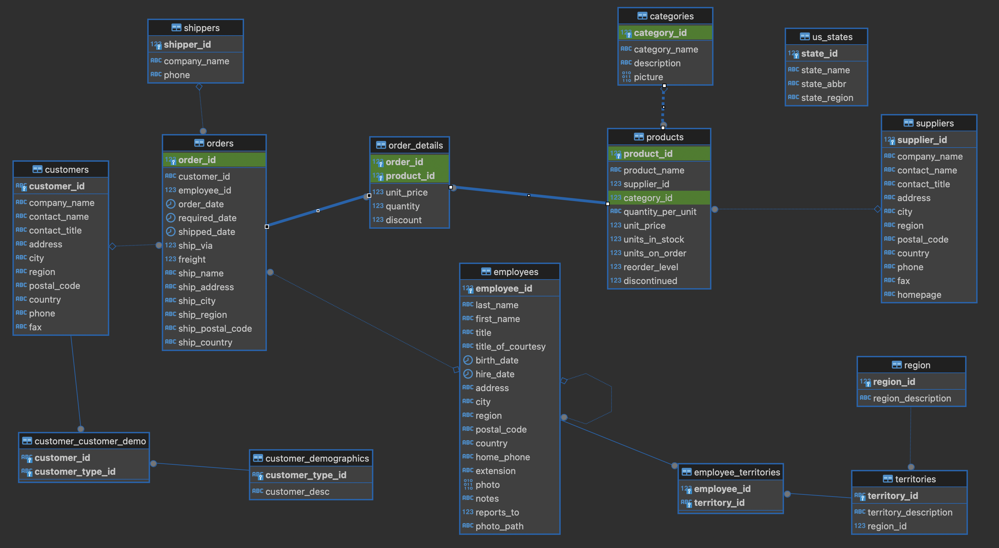

In [87]:
#Quiere saber cuándo fue la última vez que se pidió un producto de cada catgoría.
sql_query = '''SELECT c.category_name AS "Categoría", 
               MAX(o.order_date) AS "Último_Pedido"
FROM categories  AS c
INNER JOIN products AS p -- Unimos la tabla categories con products
ON p.category_id = c.category_id
INNER JOIN order_details AS od --Ahora unimos products con order_details
ON od.product_id = p.product_id
INNER JOIN orders AS o -- Por último, unimos order_details con orders
ON o.order_id = od.order_id
GROUP BY c.category_name'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,Categoría,Último_Pedido
0,Beverages,1998-05-06
1,Produce,1998-05-06
2,Condiments,1998-05-06
3,Grains/Cereals,1998-05-06
4,Meat/Poultry,1998-05-06
5,Confections,1998-05-06
6,Dairy Products,1998-05-06
7,Seafood,1998-05-06


___
- Necesita saber si existe algún producto que nunca se haya vendido por su precio original

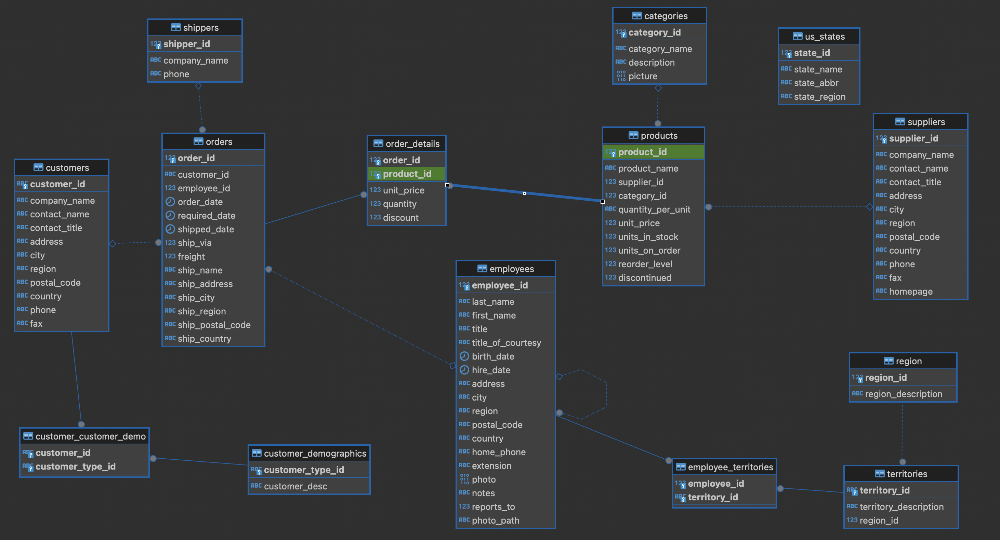

In [88]:
#Necesita saber si existe algún producto que nunca se haya vendido por su precio original. 
sql_query = '''SELECT "product_id", 
               product_name AS "Nombre_Producto", 
               MAX("unit_price") AS "Precio_Máximo"
 FROM "products" AS "p"
 GROUP BY "p"."product_id" --Agrupamos por product_id
 HAVING MAX("unit_price")<> (
    SELECT MAX("unit_price") --Creamos una subquery para poder sacar el precio unitario máximo de cada producto en todos los pedidos y buscamos cuál difiere del precio máximo original del producto.
    FROM "order_details" AS "o"
    WHERE "p"."product_id" = "o"."product_id")'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,product_id,Nombre_Producto,Precio_Máximo
0,15,Genen Shouyu,13.0


___
- Quiere tener toda la información necesaria para poder identificar un tipo de producto. En concreto, tienen especial interés por los productos con categoría "Confections". Devuelve el ID del producto, el nombre del producto y su ID de categoría.

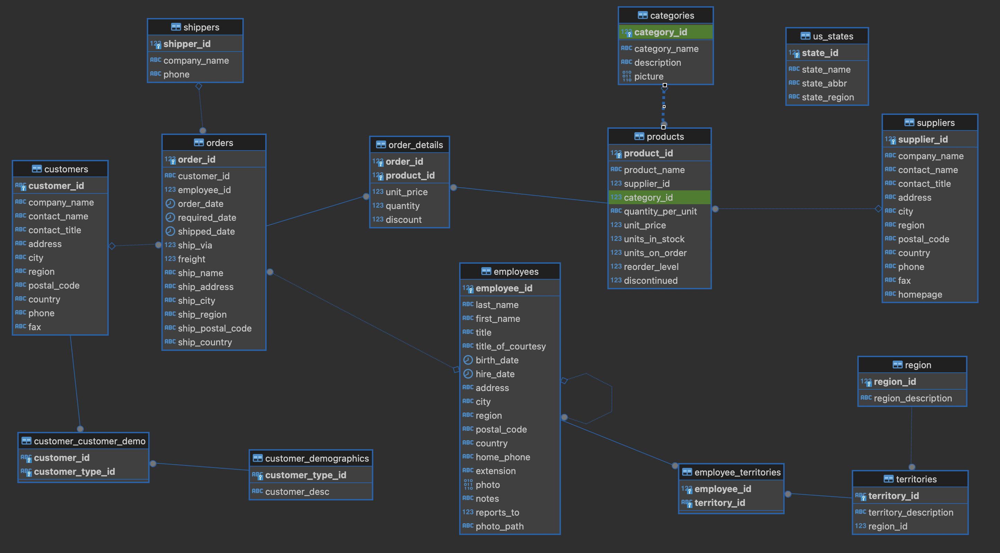


In [89]:
#Quiere tener toda la información necesaria para poder identificar un tipo de producto. En concreto, tienen especial interés por los productos con categoría "Confections". Devuelve el ID del producto, el nombre del producto y su ID de categoría.
sql_query = '''SELECT "product_id", 
                      "product_name" AS "Nombre_Producto",
                      category_id
FROM "products" AS "p"
WHERE "category_id" = (
	SELECT "category_id" --Creamos una subquery donde el nombre de la categoría sea Confections
    FROM "categories" AS "c"
    WHERE "category_name" = 'Confections')'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,product_id,Nombre_Producto,category_id
0,16,Pavlova,3
1,19,Teatime Chocolate Biscuits,3
2,20,Sir Rodney's Marmalade,3
3,21,Sir Rodney's Scones,3
4,25,NuNuCa Nuß-Nougat-Creme,3
5,26,Gumbär Gummibärchen,3
6,27,Schoggi Schokolade,3
7,47,Zaanse koeken,3
8,48,Chocolade,3
9,49,Maxilaku,3


___
- Quiere saber si existe algún proveedor del que pueda prescindir ya que todos los productos que tiene se encuentran descontinuados.

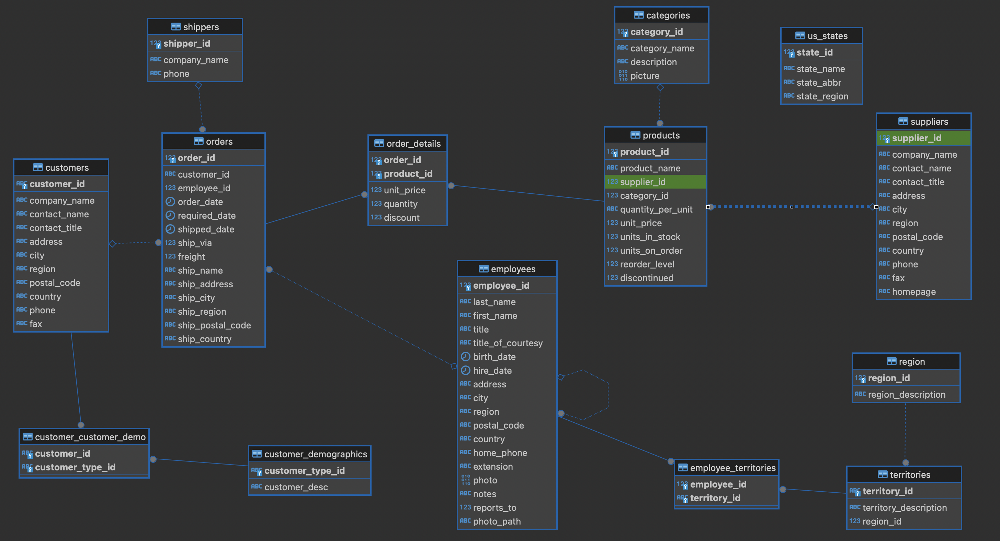

In [90]:
#Quiere saber si existe algún proveedor del que pueda prescindir ya que todos los productos que tiene se encuentran descontinuados
sql_query = '''SELECT s.company_name AS "Compañia", 
               COUNT(p.discontinued)-sum(p.discontinued) AS "Num_Prod_No_Descontinuados" --Restamos todos los productos por compañía menos los descontinuados. Si da 0 es que todos los productos están descontinuados.
FROM suppliers AS s
INNER JOIN products AS p
ON p.supplier_id = s.supplier_id
GROUP BY s.company_name
ORDER BY "Num_Prod_No_Descontinuados"'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,Compañia,Num_Prod_No_Descontinuados
0,Refrescos Americanas LTDA,0
1,Nord-Ost-Fisch Handelsgesellschaft mbH,1
2,Escargots Nouveaux,1
3,Exotic Liquids,1
4,Leka Trading,2
5,Tokyo Traders,2
6,Pasta Buttini s.r.l.,2
7,PB Knäckebröd AB,2
8,Forêts d'érables,2
9,Aux joyeux ecclésiastiques,2


___
- Extraer los clientes que compraron mas de 30 articulos "Chai" en un único pedido

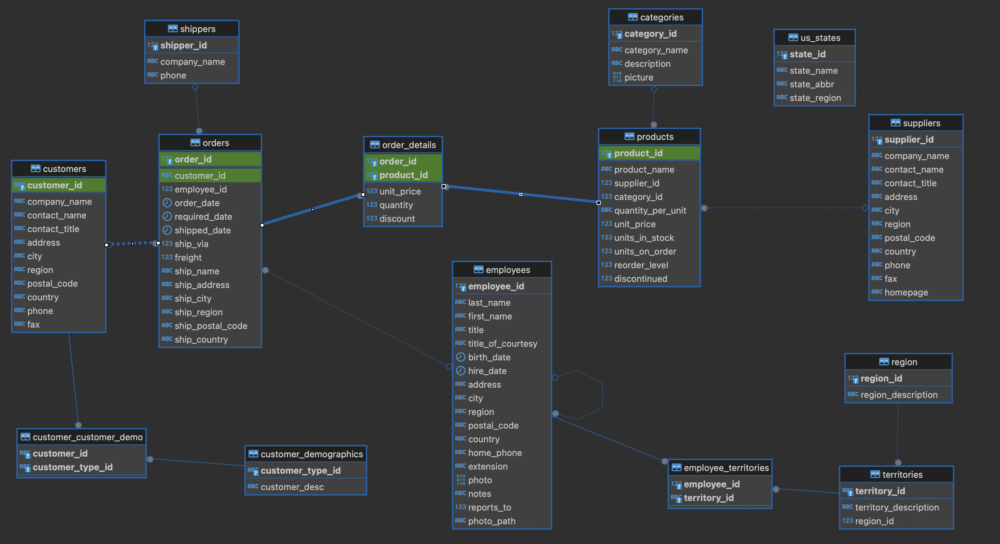


In [91]:
sql_query = '''SELECT o."order_id" AS "OrderID" , 
					  o."customer_id", 
                      c."company_name" AS "Cliente"
FROM "orders" AS o
INNER JOIN "customers" AS c
ON o."customer_id" = c."customer_id"
WHERE "order_id" IN (
	SELECT "order_id"
	FROM "order_details"
	WHERE "quantity">= 30 -- Creamos una subquery en la que la cantidad de producto pedido sea mayor de 30
	AND "product_id" = (
		SELECT "product_id"
		FROM "products"
		WHERE "product_name" = 'Chai'))-- Creamos una subquery en la que el producto sea Chai;'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,OrderID,customer_id,Cliente
0,10285,QUICK,QUICK-Stop
1,10522,LEHMS,Lehmanns Marktstand
2,10689,BERGS,Berglunds snabbköp
3,10691,QUICK,QUICK-Stop
4,10729,LINOD,LINO-Delicateses
5,10847,SAVEA,Save-a-lot Markets
6,10869,SEVES,Seven Seas Imports
7,10918,BOTTM,Bottom-Dollar Markets
8,11031,SAVEA,Save-a-lot Markets
9,11070,LEHMS,Lehmanns Marktstand


___
- Indica los clientes cuya suma total de carga en los pedidos sea mayor de 1000

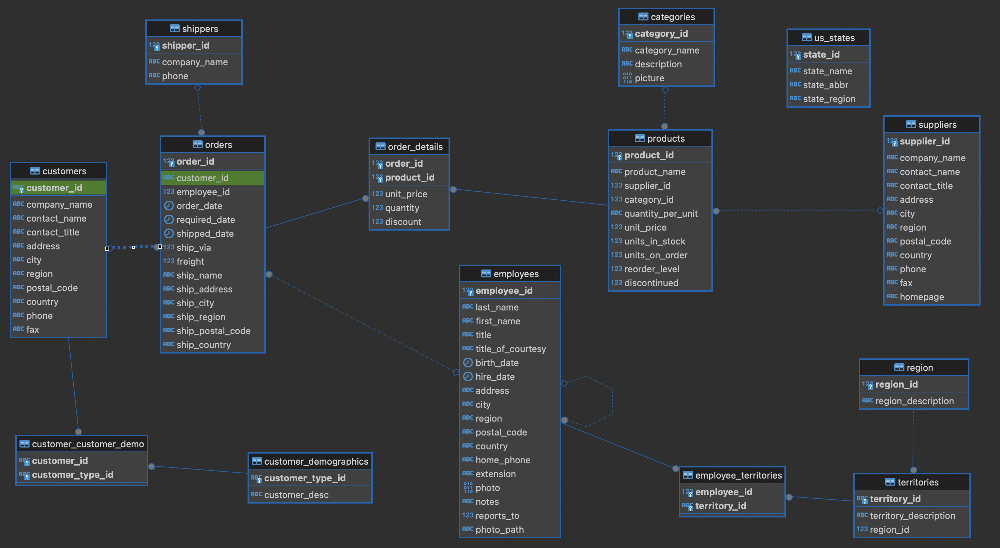


In [92]:
#Indica los clientes cuya suma total de carga en los pedidos sea mayor de 1000
sql_query = '''SELECT "customer_id", 
					  "company_name" AS "Cliente"
FROM customers
WHERE "customer_id" IN (
		SELECT "customer_id"
		FROM "orders"
		GROUP BY "customer_id"
		HAVING SUM("freight") > 1000); --Usamos HAVING porque queremos que la condición se aplique después de la agrupación'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,customer_id,Cliente
0,BERGS,Berglunds snabbköp
1,BONAP,Bon app'
2,ERNSH,Ernst Handel
3,FOLKO,Folk och fä HB
4,FRANK,Frankenversand
5,GREAL,Great Lakes Food Market
6,HILAA,HILARION-Abastos
7,HUNGO,Hungry Owl All-Night Grocers
8,LEHMS,Lehmanns Marktstand
9,MEREP,Mère Paillarde


___
- Desde recursos humanos nos piden seleccionar los nombres de las ciudades con 3 o más empleadas de cara a estudiar la apertura de nuevas oficinas.


In [93]:
#- Desde recursos humanos nos piden seleccionar los nombres de las ciudades con 3 o más empleadas de cara a estudiar la apertura de nuevas oficinas.
sql_query = '''SELECT "city" AS "Ciudad", 
               COUNT("employee_id") AS "Cantidad_Empleados"
FROM "employees"
GROUP BY "city"
HAVING COUNT("city")>=3
;'''
cursor = conn.cursor()
cursor.execute(sql_query)
rows = cursor.fetchall()
query = pd.DataFrame(rows)
colnames = [desc[0] for desc in cursor.description]
query.set_axis(colnames, axis = 1)

,Ciudad,Cantidad_Empleados
0,London,4
